In [1]:
# Nathalia Morales carnet 20160295
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [2]:
def pad(img, r, v, dtype=np.uint8):
    """Hace un padding de valor v de r pixeles alrededor de una imagen binaria img 
    y devuelva dicha imagen. Si el valor v es -1, el valor a tomar para el padding 
    es una copia de los bordes de la imagen original.
    
    Args:
        img (numpy array): imagen conformada por el array en formato de numpy
        r (int): cantidad de pixeles de padding que se quieren
        v (int): valor si quiere los pixeles de afuera o 0 como padding
        
    Returns:
        padded (numpy array): presentacion de la imagen con el padding agregado
    """
    rows, columns = img.shape
    R = img.shape[0] + 2*r
    C = img.shape[1] + 2*r
    if v != -1:
        padded = np.zeros((R,C),dtype=np.uint8)
        padded[r:rows+r, r:columns+r] = img
    else:
        padded = np.zeros((R,C),dtype=np.uint8)
        padded[r:rows+r, 0] = img[:, 0]
        padded[r:rows+r, columns+r] = img[:, img.shape[1]-1]
        padded[0, r:columns+r] = img[0, :]
        padded[rows+r, r:columns+r] = img[img.shape[0]-1, :]
        
        padded[rows+r, columns+r] = img[rows-1, columns-1]
        padded[0, columns+r] = img[0, columns-1]
        padded[rows+r, 0] = img[rows-1, 0]
        padded[0, 0] = img[0,0]

        padded[r:rows+r, r:columns+r] = img
        
    return padded

In [ ]:
def convolve(img, kernel, dtype=np.float64):
    """Efectua una convolución del kernel con la imagen. Por medio de:
    i. Validar que la imagen a procesar es en tonalidades de gris y que el kernel es cuadrado.
    ii. Realiza un padding de radio 1 con copia de los bordes.
    iii. Aplica la convolución de la imagen con padding y el kernel, 
    utilizando el padding para que la operación no se salga de los bordes de la imagen.
    iv. Devuelve la imagen convolucionada sin los valores generados en el borde del padding 
    
    Args:
        img (numpy array): imagen conformada por el array en formato de numpy
        kernel (int): matris de valores conformada por el array en formato de numpy
        
    Returns:
        padded (numpy array): presentacion de la imagen convolucionada por los pasos previamente descritos.
    """
    filas = img.shape[0]
    columnas = img.shape[1]    
    sim = kernel.shape[0]-kernel.shape[1]
    kernel = np.matrix(kernel)

    if np.amin(img) > -1 and sim == 0 and np.amax(img) < 256 and len(img.shape) == 2:
        img = pad(img, 1, -1)
        padded = np.zeros((filas,columnas),dtype=np.float64)
        for i in range(1, filas+1):
            for j in range(1, columna
                           s+1):
                matrix = np.matrix(img[i-1:i+2, j-1:j+2]) 
                res_list = np.multiply(kernel,matrix)
                suma = np.sum(res_list)/9
                padded[i-1][j-1] = suma
        return padded
    else:
        print("La imagen debe de estar en tonalidades de gris. Solo un canal se debe de ingresar a la funcion a la vez.")
    

In [14]:
def float64_to_uint8(img):
    """Convierte una imagen de tipo float64 a tipo uint8.
    
    Args:
        img (numpy array): imagen conformada por el array en formato de numpy
        
    Returns:
        img (numpy array): presentacion de la imagen con la normalizacion aplicada
    """
    mini = np.min(img)
    maxi = np.max(img)
    img = ((img-mini)/(maxi-mini))*255
    return np.uint8(img)

In [83]:
def gradient2magnitude(gx, gy):
    """ Genera una imagen que representa la magnitud del gradiente calculada a partir 
    de un par de imágenes que representan gradiente horizontal y vertical. 
    
    Args:
        gx (numpy array): imagen conformada por el array con la convolucion en x en formato de numpy
        gy (numpy array): imagen conformada por el array con la convolucion en y en formato de numpy
        
    Returns:
        img (numpy array): imagen con la magnitud entre ambos gradientes
    """
    return np.sqrt((np.square(gx))+(np.square(gy)))

In [85]:
def gradient2angle(gx, gy):
    """ Genera una imagen que representa el ángulo del gradiente calculado 
    a partir de un par de imágenes que representan gradiente horizontal y vertical.
    
    Args:
        gx (numpy array): imagen conformada por el array con la convolucion en x en formato de numpy
        gy (numpy array): imagen conformada por el array con la convolucion en y en formato de numpy
        
    Returns:
        img (numpy array): imagen que contiene los ángulos del gradiente entre pi y menos pi
    """
    return  np.arctan2(gy,gx)

In [218]:
arr = np.array([[ 255,   0,   0,   0,   0,   0,   255],
               [  255, 255,   0,   255,   0, 255,   0],
               [  0,     0,   0,   0,   0,   0,   255],
               [  0,     0,   0,   0, 255,   0,   0],
               [  0,   255,   0, 255,   0, 255,   0],
               [  0,     0,   0,   0, 255,   0,   0],
               [  0,     0,   255,   0, 255,   0,   0],
               [  0,     0,   0,   0,   0,   0,   255]])
arr = np.array([[255,0,255],
        [0,255,0],
        [255,255,0]])

In [157]:
print(arr.shape)
print(arr2.shape)

(8, 7)
(8, 7)


In [191]:
arr2

array([[ 36,   0, 145, 145, 145, 255, 218],
       [109,  36, 145, 145, 145, 218, 145],
       [145, 109, 145, 182, 145, 182, 182],
       [182, 145, 145, 218, 145, 109, 145],
       [218, 145, 145, 218, 145,  72,  72],
       [182, 182, 145, 218, 145,  36, 109],
       [145, 218, 145, 182, 145,  72, 182],
       [145, 182, 145, 145, 145, 218, 255]], dtype=uint8)

In [223]:
print(arr)
arr2 = float64_to_uint8(convolve(arr,kx))

[[255   0 255]
 [  0 255   0]
 [255 255   0]]
(5, 5)
1   1  
 [[255 255   0]
 [255 255   0]
 [  0   0 255]]
1   2  
 [[255   0 255]
 [255   0 255]
 [  0 255   0]]
1   3  
 [[  0 255 255]
 [  0 255 255]
 [255   0   0]]
2   1  
 [[255 255   0]
 [  0   0 255]
 [255 255 255]]
2   2  
 [[255   0 255]
 [  0 255   0]
 [255 255   0]]
2   3  
 [[  0 255 255]
 [255   0   0]
 [255   0   0]]
3   1  
 [[  0   0 255]
 [255 255 255]
 [255 255 255]]
3   2  
 [[  0 255   0]
 [255 255   0]
 [255 255   0]]
3   3  
 [[255   0   0]
 [255   0   0]
 [255   0   0]]
[[ 85 170 255]
 [212 127  85]
 [212  42   0]]


In [11]:
path = '/Users/nmorales/Documents/U/2_Semestre 2019/ComputerVision/ProyectosClase/Repo/img/lenna.png'
kx = np.array([[-1, 0, 1],
               [-2, 0, 2],
               [-1, 0, 1]])
ky = np.array([[-1, -2, -1],
               [ 0, 0,  0],
               [ 1, 2, 1]])
img = cv.imread(path, cv.IMREAD_GRAYSCALE)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

#img2 = convolve(img,kx)
#plt.imshow(img2, 'gray')
#img3 = float64_to_uint8(img2)
#plt.imshow(img3, 'gray')
#img3[:10,:10]

In [149]:
print(img.shape)
print(gx.shape)

(220, 220, 3)
(220, 220)


(220, 220)


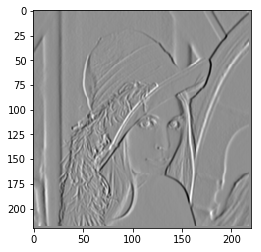

In [148]:
print(img[:,:,0].shape)
gx = convolve(img[:,:,0],kx)
plt.imshow(gx, 'gray')

In [57]:
gx = float64_to_uint8(gx)
gy = convolve(img[:,:,0],ky)
gy = float64_to_uint8(gy)
done = gradient2magnitude(gx, gy)
doneso = gradient2angle(gx, gy)
plt.imshow(done, "gray")

In [139]:
img.shape

(220, 220, 3)

In [ ]:
rgbimg = cv2.cvtColor(hsvimg, cv2.COLOR_HSV2RGB)

In [126]:
kx = np.array([[-1, 0, 1], # creando ambas matrices a usar
               [-2, 0, 2],
               [-1, 0, 1]])
ky = np.array([[-1, -2, -1],
               [ 0, 0,  0],
               [ 1, 2, 1]])
def rgbs(img, kx, ky):
    """ Genera una imagen que 
    
    Args:
        img (numpy array): imagen conformada por el array de numpy
        kx (numpy array): matriz para hacer el gradiente en x
        ky (numpy array): matriz para hacer el gradiente en y
        
    Returns:
        img (numpy array): imagen rgb_magnitudes.png (tipo uint8)
    """
    grad2angle = [[],[],[]]
    grad2mag = [[],[],[]]

    for i in range(0,3):
        gx = convolve(img[:,:,i],kx)
        gy = convolve(img[:,:,i],ky)
        grad2mag[i] = float64_to_uint8(gradient2magnitude(gx, gy))
        grad2angle[i] = float64_to_uint8(gradient2angle(gx, gy))
    grad2mag_img = cv.merge(grad2mag)
    grad2angle_img = cv.merge(grad2angle)
    
    img_save(grad2mag_img, "Color gradient", "rgb_magnitudes.png")
    img_save(grad2angle_img, "Angle", "rgb_angles.png")
    
    return

In [136]:
def img_save(img, title=None, filename=None):
    """Presenta y guarda la imagen con el titulo
    Args:
    img (numpy array, imagen): imagen 
    title (lista de strings): lista con dos elementos de tipo string 
     para los titulos de las imagenes
    filename (string): titulo de la imagen a descargar en el folder local 
    
    Returns:
        result (img): Presentacion de tres imagenes lado a lado
        con el titulo opcional y con la descarga opcional de ambas en un solo formato.
    """ 
    fig = plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

    plt.savefig(filename)

In [207]:
for i in range(1, 3):
    print(i)

1
2


In [132]:
img = cv.imread(path, cv.IMREAD_COLOR)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

In [ ]:
rgbs(img, kx, ky)

(222, 222)
1   1  
 [[225 225 224]
 [225 225 224]
 [225 225 224]]
1   2  
 [[225 224 227]
 [225 224 227]
 [225 224 227]]
1   3  
 [[224 227 227]
 [224 227 227]
 [224 227 227]]
1   4  
 [[227 227 226]
 [227 227 226]
 [227 227 226]]
1   5  
 [[227 226 225]
 [227 226 225]
 [227 226 224]]
1   6  
 [[226 225 222]
 [226 225 222]
 [226 224 222]]
1   7  
 [[225 222 221]
 [225 222 221]
 [224 222 221]]
1   8  
 [[222 221 223]
 [222 221 223]
 [222 221 222]]
1   9  
 [[221 223 223]
 [221 223 223]
 [221 222 223]]
1   10  
 [[223 223 220]
 [223 223 220]
 [222 223 220]]
1   11  
 [[223 220 223]
 [223 220 223]
 [223 220 223]]
1   12  
 [[220 223 221]
 [220 223 221]
 [220 223 221]]
1   13  
 [[223 221 222]
 [223 221 222]
 [223 221 222]]
1   14  
 [[221 222 225]
 [221 222 225]
 [221 222 225]]
1   15  
 [[222 225 224]
 [222 225 224]
 [222 225 224]]
1   16  
 [[225 224 229]
 [225 224 229]
 [225 224 229]]
1   17  
 [[224 229 231]
 [224 229 231]
 [224 229 231]]
1   18  
 [[229 231 232]
 [229 231 232]
 [229 